低代码机器学习库--Pycaret
https://zhuanlan.zhihu.com/p/412621015
https://mp.weixin.qq.com/s?src=11&timestamp=1655434363&ver=3865&signature=ARULrBUhhwrTnyOlEMGIt7IMAFalYxQT9whTNgU9wpSgHOY3DlsK5Ow9aaS1B-wA0CPLdsrlNo9QseN6wB3HO2txjUWi5jA0FHsipx27rsc-U1ghJmAbkeFCL6h2ih02&new=1

机器学习建模工具PyCaret详讲 https://blog.csdn.net/qq_43627540/article/details/107667298
    1  PyCaret 1.0.0简介
    2  PyCaret入门
    3  获取数据
    4  搭建环境
        4.1  预处理介绍
        4.2  采样与拆分
            4.2.1  训练/测试数据拆分
            4.2.2  采样（Sampling）
        4.3  数据准备
            4.3.1  缺失值处理
            4.3.2  更改数据类型
            4.3.3  独热编码（One Hot）
            4.3.4  序数编码
            4.3.5  基数编码
            4.3.6  处理未知级别
        4.4  数据规范化与转换
            4.4.1  数据规范化 （Normalization）
            4.4.2  数据转换
            4.4.3  目标转换
        4.5  特征工程
            4.5.1  特征交互
            4.5.2  多项式特征
            4.5.3  三角特征
            4.5.4  分组特征
            4.5.5  分箱数字特征
            4.5.6  合并稀有级别
        4.6  特征选择
            4.6.1  特征重要性
            4.6.2  消除多重共线性
            4.6.3  主成分分析
            4.6.4  忽略低方差
        4.7  无监督
            4.7.1  创建聚类
            4.7.2  删除异常值
    5  模型训练
        5.1  比较模型
            5.1.1  分类示例
            5.1.2  回归示例
        5.2  创建模型
            5.2.1  分类
            5.2.2  回归
            5.2.3  聚类
            5.2.4  异常检测
            5.2.5  关联规则挖掘
        5.3  调优模型
            5.3.1  分类示例
            5.3.2  回归示例
            5.3.3  聚类示例
            5.3.4  异常检测实例
    6  集成模型
        6.1  Bagging
        6.2  Boosting
        6.3  Stack
        6.4  Blend
            6.4.1  分类示例
            6.4.2  回归示例
    7  解释模型
        7.1  显示模型
            7.1.1  分类
            7.1.2  回归
            7.1.3  聚类
            7.1.4  异常检测
            7.1.5  关联规则挖掘
        7.2  解释模型
            7.2.1  汇总图
            7.2.2  相关图
            7.2.3  观察层面的因果图
            7.2.4  分配模型
            7.2.5  校准模型
            7.2.6  优化阈值
    8  预测模型
    9  部署模型
        9.1  定型模型
        9.2  部署模型
        9.3  使用部署模型的预测
        9.4  保存模型

In [1]:
from pycaret.utils import version
version()
# https://pycaret.gitbook.io/docs/get-started/functions/analyze#interpret_model

'3.0.0.rc4'

In [2]:
# 1.获取数据
from pycaret.datasets import get_data
from pycaret.classification import *
# diabetes = get_data('diabetes')

# 使用Pandas加载CSV
from pandas import read_csv
import numpy as np
import pandas as pd

# df = read_csv('/home/wane/Desktop/EP/Structured_Data/process_PT-22-multi-1.csv')
# df = pd.read_csv(r"C:\\Users\wane199\\Desktop\\EP\\REFER\\BLS\\KAI\\process_rad_lat_7.csv")
df = pd.read_csv(r"C:\\Users\\wane199\\Desktop\\sci\\cph\\XML\\TLE234group_2019.csv")
# df = pd.read_csv(r"/home/wane/Desktop/EP/Structured_Data/process_PT-22.csv")
df = df.iloc[:,6:]
# df = df.drop(['Y'], axis=1)
# df = df.iloc[:,np.r_[1,5,8,12,14]]
# df=df.iloc[:, np.r_[1,8,12,14,15,17]]
df.head()

,oneyr,AI_radscore,Lat_radscore,side,Sex,Surgmon,Onsetmon,Durmon,Freq,SE,SGS,early_brain_injury,familial_epilepsy,brain_hypoxia,Central_Nervous_System_Infections,traumatic_brain_injury,history_of_previous_surgery,MRI
0,0,0.274705,0.036870,1,1,216,24,192,3,0,1,0,0,0,1,1,0,1
1,0,-0.190641,-0.239799,1,0,432,264,168,3,1,1,0,0,0,0,1,0,1
2,0,0.420175,0.422738,1,0,444,276,168,3,0,0,0,0,0,0,0,0,1
3,0,-0.573500,-0.094680,1,0,384,120,264,1,0,0,0,0,0,0,0,0,1
4,0,0.028115,-0.289840,1,0,264,192,72,3,0,1,0,0,0,0,0,0,1


In [61]:
# .query方法
train = df.query('Group == "Training"')
test = df[df['Group'] == 'Test']

y_train = train['Y'];        y_test = test['Y']
X_train = train.iloc[:, 3:];  X_test = test.iloc[:, 3:]

In [3]:
# EDA
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#特征与目标变量之前的相关性分析
correlation = df.corr()
correlation['oneyr'].sort_values()

#特征相互之间的关系可视化
# sns.pairplot(X_train[:7,:])

SE                                  -0.114040
brain_hypoxia                       -0.059807
early_brain_injury                  -0.054477
Freq                                 0.005382
Durmon                               0.010356
MRI                                  0.028534
side                                 0.030752
Central_Nervous_System_Infections    0.048994
Onsetmon                             0.051256
traumatic_brain_injury               0.064794
Surgmon                              0.065111
history_of_previous_surgery          0.083030
Sex                                  0.084168
familial_epilepsy                    0.093369
SGS                                  0.163249
Lat_radscore                         0.209624
AI_radscore                          0.213366
oneyr                                1.000000
Name: oneyr, dtype: float64

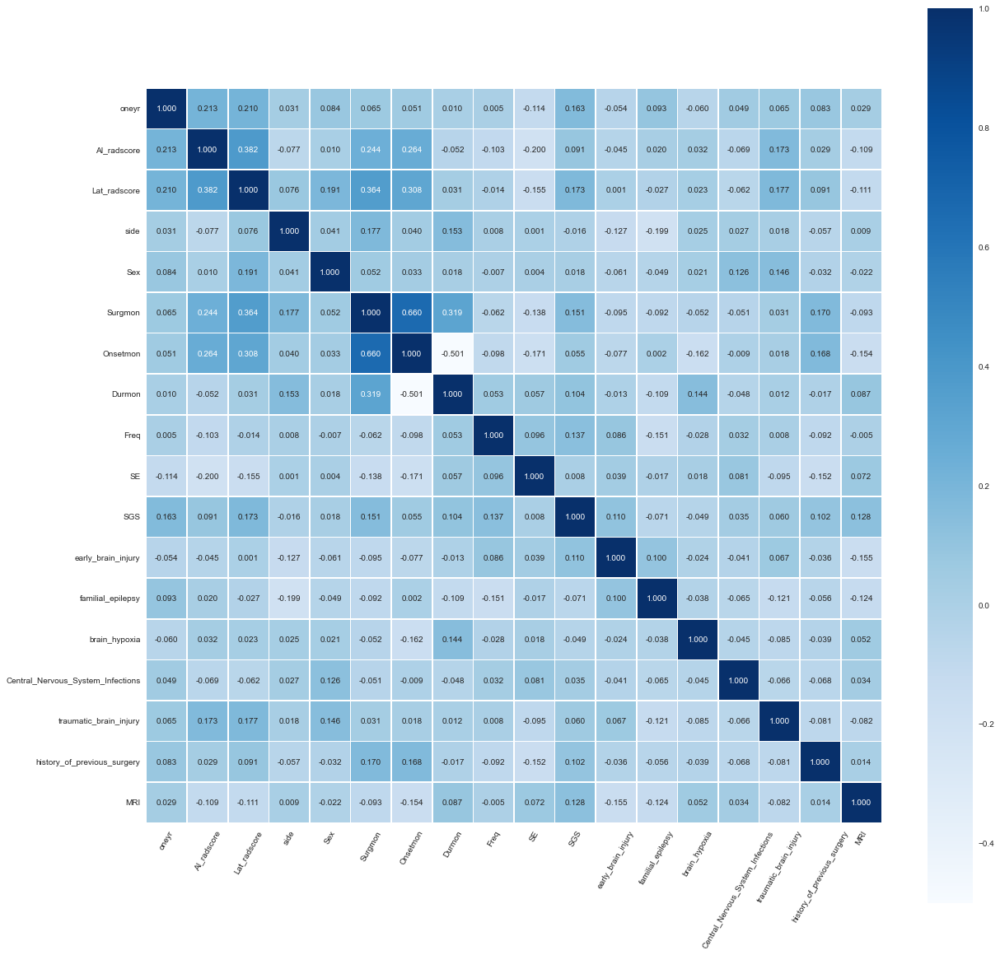

In [4]:
f, ax = plt.subplots(figsize=(20,20)) # 定义图形尺寸

sns.heatmap(df.corr('pearson'),annot=True, linewidths = .5, fmt='.3f', ax = ax, square=True, cmap = 'Blues')
plt.xticks(rotation=60)

filepath = 'C:\\Users\\wane199\\Desktop\\sci\\cph\XML\\'
fig_name = 'heatplot.pdf'
# fig_path为想要存入的文件夹或地址
fig_path = filepath + '\\' + fig_name
# plt.savefig(fig_path, dpi = 900)

# 显示特征相关性热力图
plt.show()

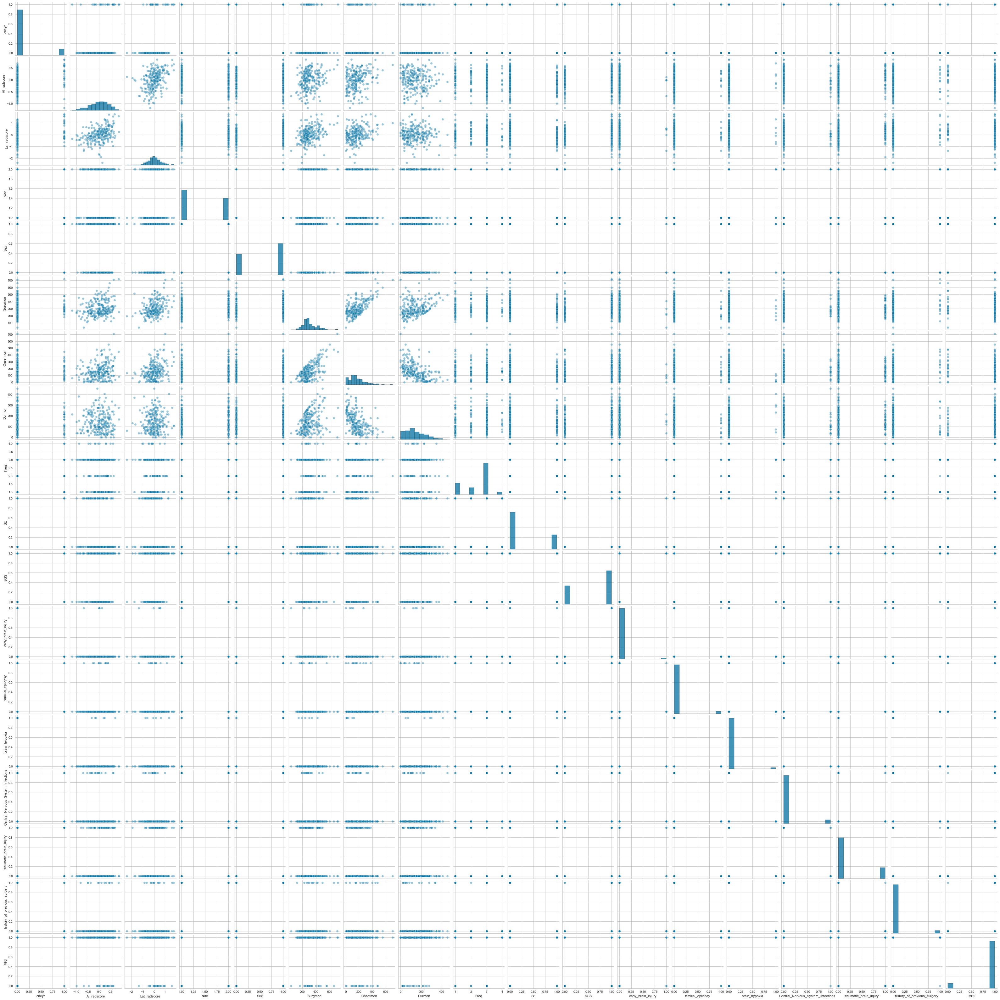

In [32]:
pairplot_fig = sns.pairplot(df, kind = 'scatter', palette="Set2", 
                                height=2.5, plot_kws=dict(s=50, alpha=0.4))
pairplot_fig.savefig(fig_path, dpi = 600)

In [63]:
# load dataset
import pandas as pd
# train=pd.read_csv('train.csv')
# test=pd.read_csv('test.csv')
train = train.iloc[:,2:]
test = test.iloc[:,2:]

# init setup
from pycaret . classification import *
s=setup(train,target='Y')

from sklearn.metrics import average_precision_score
add_metric('apc', 'APC', average_precision_score, target = 'pred_proba')

# model training and selection
best = compare_models()

# analyze best model
evaluate_model(best)

# predict on new data
# predictions=predict_model(best,data=test)


# save best pipeline
# save_model(best,'my_best_pipeline')

,Description,Value
0,Session id,402
1,Target,Y
2,Target type,Binary
3,Original data shape,"(248, 8)"
4,Transformed data shape,"(248, 8)"
5,Transformed train set shape,"(173, 8)"
6,Transformed test set shape,"(75, 8)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,APC,TT (Sec)
lr,Logistic Regression,0.9487,0.9723,0.9409,0.9826,0.9596,0.8891,0.8944,0.9885,0.0290
ridge,Ridge Classifier,0.9431,0.0000,0.9242,0.9917,0.9535,0.8810,0.8911,0.0000,0.0060
lda,Linear Discriminant Analysis,0.9431,0.9721,0.9242,0.9917,0.9535,0.8810,0.8911,0.9880,0.0070
knn,K Neighbors Classifier,0.9373,0.9753,0.9326,0.9749,0.9499,0.8645,0.8728,0.9825,0.0120
et,Extra Trees Classifier,0.9373,0.9762,0.9326,0.9756,0.9502,0.8630,0.8715,0.9905,0.0320
nb,Naive Bayes,0.9369,0.9626,0.9152,0.9923,0.9482,0.8674,0.8807,0.9852,0.0070
ada,Ada Boost Classifier,0.9085,0.9557,0.9326,0.9389,0.9317,0.7888,0.8025,0.9809,0.0170
lightgbm,Light Gradient Boosting Machine,0.9023,0.9628,0.9242,0.9371,0.9276,0.7733,0.7832,0.9843,0.0110
gbc,Gradient Boosting Classifier,0.8967,0.9613,0.9326,0.9201,0.9247,0.7556,0.7613,0.9835,0.0150
rf,Random Forest Classifier,0.8964,0.9610,0.9159,0.9365,0.9222,0.7604,0.7693,0.9846,0.0390


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [18]:
X_train

,AI_radscore,Lat_radscore,side,Sex,Surgmon,Onsetmon,Durmon,Freq,SE,SGS,early_brain_injury,familial_epilepsy,brain_hypoxia,Central_Nervous_System_Infections,traumatic_brain_injury,history_of_previous_surgery,MRI
0,0.273099,-0.103958,1.0,0.0,264.0,132.0,132.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1,0.207596,0.524345,1.0,0.0,504.0,480.0,24.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.097393,0.283570,1.0,1.0,348.0,228.0,120.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,-0.197630,-0.132193,1.0,1.0,264.0,36.0,228.0,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.280434,0.911711,1.0,1.0,420.0,300.0,120.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158,0.072201,0.648503,1.0,1.0,348.0,192.0,156.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
159,-0.544952,-0.453607,1.0,1.0,173.0,12.0,161.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
160,-0.505757,-0.035475,1.0,0.0,264.0,216.0,48.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
161,-0.083535,-0.048179,2.0,1.0,162.0,144.0,18.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
# Importing module and initializing setup
from pycaret.classification import *
from imblearn.combine import SMOTEENN, SMOTETomek
'''
numeric_imputation: string, default = ‘mean’
如果在数字特征中发现缺失值，则将用特征的平均值进行估算。
另一个可用的选项是“median”，它使用训练数据集中的中值来估算值。

categorical_imputation: string, default = ‘constant’
如果在分类特征中发现缺失的值，则将使用常量“not_available”值进行估算。
另一个可用的选项是“mode”，
它使用训练数据集中最频繁的值来估算缺失的值。
'''
clf1 = setup(data = df, target = 'oneyr', train_size = 0.7, session_id = 123, fix_imbalance = True,  fix_imbalance_method = SMOTEENN()) 
# fix_imbalance: bool, default = False，#默认; fix_imbalance_method: obj, default = None 默认使用’SMOTE’方法

X_train, X_test, y_train, y_test = get_config('X_train'), get_config('X_test'), get_config('y_train'), get_config('y_test')

,Description,Value
0,Session id,123
1,Target,oneyr
2,Target type,Binary
3,Original data shape,"(234, 18)"
4,Transformed data shape,"(242, 18)"
5,Transformed train set shape,"(171, 18)"
6,Transformed test set shape,"(71, 18)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


In [8]:
'''
numeric_features: string, default = None
如果推断的数据类型不正确，则可以使用数值特征覆盖推断的类型。
如果在运行安装程序时，“column1”的类型被推断为类别而不是数字，
则可以使用此参数通过传递 numeric_features=['column1'] 来覆盖。

categorical_features: string, default = None
如果推断的数据类型不正确，则可以使用分类特征覆盖推断的类型。
如果在运行安装程序时“column1”的类型被推断为数值而不是类别，
则可以使用此参数通过传递 categorical_features=['column1'] 覆盖该类型。

date_features: string, default = None
如果数据有一个在运行安装程序时未自动检测到的DateTime列，
则可以通过传递 date_features='date_column_name' 来使用此参数。
它可以处理多个日期列。建模中不使用日期列。
相反，将执行特征提取，并从数据集中删除日期列。
如果日期列包含时间戳，则还将提取与时间相关的特征。

ignore_features: string, default = None
如果建模时应忽略任何特征，则可以将其传递给参数 ignore_features。
当推断出ID和DateTime列时，将自动设置为忽略以进行建模。
'''
# Importing module and initializing setup
from pycaret.classification import *

clf1 = setup(data = df, target = 'Y', session_id=123, fold_shuffle=True,
                  normalize = True, transformation = True,
                  remove_multicollinearity = True, multicollinearity_threshold = 0.95)

X_train, X_test, y_train, y_test = get_config('X_train'), get_config('X_test'), get_config('y_train'), get_config('y_test')

,Description,Value
0,Session id,123
1,Target,Y
2,Target type,Binary
3,Original data shape,"(347, 10)"
4,Transformed data shape,"(347, 11)"
5,Transformed train set shape,"(242, 11)"
6,Transformed test set shape,"(105, 11)"
7,Ordinal features,1
8,Numeric features,7
9,Categorical features,2


In [6]:
df['Y'].value_counts()

1    234
0    113
Name: Y, dtype: int64

In [7]:
df.isna().sum

<bound method NDFrame._add_numeric_operations.<locals>.sum of          Y  original_firstorder_Mean  original_gldm_DependenceEntropy  \
0    False                     False                            False   
1    False                     False                            False   
2    False                     False                            False   
3    False                     False                            False   
4    False                     False                            False   
..     ...                       ...                              ...   
342  False                     False                            False   
343  False                     False                            False   
344  False                     False                            False   
345  False                     False                            False   
346  False                     False                            False   

     log.sigma.5.0.mm.3D_firstorder_10Percentile  \
0        

In [22]:
df1 = df[["Y","age","sex","P","DM","Ca","TBS","Dialysis_duration"]]
df1

,Y,age,sex,P,DM,Ca,TBS,Dialysis_duration
0,0,49,1,2,1,1,1.201,0.0
1,0,31,0,3,0,2,1.371,0.0
2,0,65,0,2,1,2,1.312,0.0
3,0,68,0,1,1,3,1.191,0.0
4,1,66,1,2,0,2,1.431,0.0
...,...,...,...,...,...,...,...,...
336,0,52,1,3,1,2,1.305,27.0
337,0,54,0,3,0,1,1.358,2.0
338,0,59,0,2,0,2,1.270,73.0
339,0,66,1,3,1,2,1.393,0.0


In [5]:
# 2.搭建环境，分类模块
from pycaret.classification import *
exp1 = setup(data = df, target = 'oneyr',  fold_shuffle=True, session_id= 123,  train_size = 0.7, use_gpu=True)
# exp1 = setup(data = df, target = 'Label', session_id=123, use_gpu=True) 
#                           fold_shuffle=True,
#                           remove_multicollinearity = True,
#                           feature_interaction = True,
#                           trigonometry_features = True,
#                           feature_selection = False
X_train, X_test, y_train, y_test = get_config('X_train'), get_config('X_test'), get_config('y_train'), get_config('y_test')

,Description,Value
0,Session id,123
1,Target,oneyr
2,Target type,Binary
3,Original data shape,"(234, 18)"
4,Transformed data shape,"(234, 18)"
5,Transformed train set shape,"(163, 18)"
6,Transformed test set shape,"(71, 18)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


In [13]:
X_train, X_test, y_train, y_test = get_config('X_train'), get_config('X_test'), get_config('y_train'), get_config('y_test')

,Description,Value
0,Session id,123
1,Target,Label
2,Target type,Multiclass
3,Target mapping,"CN: 0, Left: 1, Right: 2"
4,Original data shape,"(347, 10)"
5,Transformed data shape,"(347, 10)"
6,Transformed train set shape,"(242, 10)"
7,Transformed test set shape,"(105, 10)"
8,Ordinal features,1
9,Numeric features,8


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,APC
Fold,,,,,,,,
0,0.8000,0.8664,0.8000,0.8069,0.7858,0.6898,0.7063,0.0000
1,0.8800,0.9778,0.8800,0.8806,0.8782,0.8166,0.8187,0.0000
2,0.7917,0.9013,0.7917,0.7891,0.7886,0.6800,0.6819,0.0000
3,0.9167,0.9153,0.9167,0.9306,0.9121,0.8696,0.8796,0.0000
4,0.8333,0.9437,0.8333,0.8333,0.8333,0.7487,0.7487,0.0000
5,0.7917,0.9108,0.7917,0.7969,0.7925,0.6875,0.6893,0.0000
6,0.8750,0.9554,0.8750,0.8802,0.8755,0.8125,0.8146,0.0000
7,0.8750,0.9162,0.8750,0.8802,0.8755,0.8125,0.8146,0.0000
8,0.8750,0.9216,0.8750,0.8802,0.8755,0.8125,0.8146,0.0000


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,APC
0,Random Forest Classifier,0.8381,0.9343,0,0,0,0.7547,0.7548,0


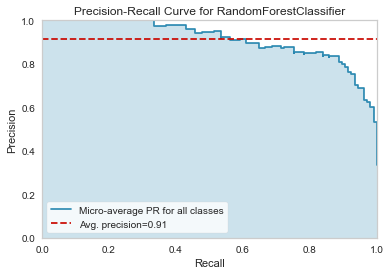

In [13]:
from pycaret.classification import *
s = setup(df, target = 'Label', session_id = 123, fix_imbalance = False)

from sklearn.metrics import average_precision_score
add_metric('apc', 'APC', average_precision_score, target = 'pred_proba')

rf = create_model('rf') #lr/dt/rf/gbc

predict_model(rf);

plot_model(rf, plot = 'pr')

In [6]:
# check transformed X_train
get_config('X_train')

,AI_radscore,Lat_radscore,side,Sex,Surgmon,Onsetmon,Durmon,Freq,SE,SGS,early_brain_injury,familial_epilepsy,brain_hypoxia,Central_Nervous_System_Infections,traumatic_brain_injury,history_of_previous_surgery,MRI
0,0.273099,-0.103958,1.0,0.0,264.0,132.0,132.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1,0.207596,0.524345,1.0,0.0,504.0,480.0,24.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.097393,0.283570,1.0,1.0,348.0,228.0,120.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,-0.197630,-0.132193,1.0,1.0,264.0,36.0,228.0,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.280434,0.911711,1.0,1.0,420.0,300.0,120.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158,0.072201,0.648503,1.0,1.0,348.0,192.0,156.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
159,-0.544952,-0.453607,1.0,1.0,173.0,12.0,161.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
160,-0.505757,-0.035475,1.0,0.0,264.0,216.0,48.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
161,-0.083535,-0.048179,2.0,1.0,162.0,144.0,18.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
# list columns of transformed X_train]
get_config('y_train')

0      0
1      0
2      0
3      1
4      0
      ..
158    0
159    0
160    0
161    0
162    0
Name: oneyr, Length: 163, dtype: int8

In [8]:
# check all the available models
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [6]:
# 3.比较模型
from sklearn.metrics import average_precision_score
add_metric('apc', 'APC', average_precision_score, target = 'pred_proba')

best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,APC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8901,0.7619,0.3500,0.4833,0.3900,0.3464,0.3600,0.5912,0.1140
rf,Random Forest Classifier,0.8838,0.7633,0.2000,0.3500,0.2500,0.2169,0.2297,0.6123,0.4790
lda,Linear Discriminant Analysis,0.8838,0.6424,0.1000,0.2000,0.1333,0.1188,0.1275,0.4177,0.0440
xgboost,Extreme Gradient Boosting,0.8838,0.7774,0.3000,0.4000,0.3333,0.2871,0.2945,0.6068,0.2400
et,Extra Trees Classifier,0.8835,0.6617,0.1000,0.2000,0.1333,0.1182,0.1269,0.4427,0.1840
ada,Ada Boost Classifier,0.8831,0.7886,0.4000,0.4333,0.3933,0.3450,0.3569,0.5900,0.1290
lr,Logistic Regression,0.8776,0.6621,0.0500,0.1000,0.0667,0.0551,0.0592,0.4418,0.2210
ridge,Ridge Classifier,0.8772,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0350
dummy,Dummy Classifier,0.8772,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1228,0.0390
svm,SVM - Linear Kernel,0.8654,0.0000,0.0000,0.0000,0.0000,-0.0133,-0.0133,0.0000,0.0330


In [10]:
print(best_top5)

[AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=123), XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=0,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=-1, num_parallel_tree=1, objective='binary:logistic',
              predictor='auto', ...), RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_dept

In [11]:
type(best_top5)

list

In [13]:
from pycaret.classification import *
from imblearn.over_sampling import ADASYN, BorderlineSMOTE, KMeansSMOTE, RandomOverSampler, SMOTE, SMOTENC, SVMSMOTE
exp1 = setup(
    df, 
    target = 'oneyr',
    fix_imbalance=True,
    fix_imbalance_method=ADASYN() # この行で指定
)

,Description,Value
0,Session id,6816
1,Target,oneyr
2,Target type,Binary
3,Original data shape,"(234, 18)"
4,Transformed data shape,"(361, 18)"
5,Transformed train set shape,"(290, 18)"
6,Transformed test set shape,"(71, 18)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


In [9]:
# 3.比较模型
# 选取AUC最优5个模型
best_top5 = compare_models(sort = 'AUC',n_select = 20)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ada,Ada Boost Classifier,0.8831,0.7886,0.4000,0.4333,0.3933,0.3450,0.3569,0.1180
xgboost,Extreme Gradient Boosting,0.8838,0.7774,0.3000,0.4000,0.3333,0.2871,0.2945,0.2460
rf,Random Forest Classifier,0.8838,0.7633,0.2000,0.3500,0.2500,0.2169,0.2297,0.5230
gbc,Gradient Boosting Classifier,0.8901,0.7619,0.3500,0.4833,0.3900,0.3464,0.3600,0.1140
lightgbm,Light Gradient Boosting Machine,0.8588,0.7493,0.2500,0.3250,0.2667,0.2108,0.2212,0.4030
lr,Logistic Regression,0.8776,0.6621,0.0500,0.1000,0.0667,0.0551,0.0592,0.1080
et,Extra Trees Classifier,0.8835,0.6617,0.1000,0.2000,0.1333,0.1182,0.1269,0.1820
knn,K Neighbors Classifier,0.8651,0.6464,0.2000,0.2000,0.1833,0.1403,0.1485,0.0700
lda,Linear Discriminant Analysis,0.8838,0.6424,0.1000,0.2000,0.1333,0.1188,0.1275,0.0420
nb,Naive Bayes,0.2511,0.5862,0.9000,0.1290,0.2255,0.0142,0.0722,0.0440


Processing:   0%|          | 0/79 [00:00<?, ?it/s]

In [13]:
# 4.创建模型
ada = create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8824,0.7333,0.0000,0.0000,0.0000,0.0000,0.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.8235,0.3667,0.0000,0.0000,0.0000,-0.0851,-0.0913
3,0.9375,0.8571,0.5000,1.0000,0.6667,0.6364,0.6831
4,0.9375,1.0000,1.0000,0.6667,0.8000,0.7647,0.7868
5,0.8750,0.8929,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.8125,0.6786,0.0000,0.0000,0.0000,-0.0909,-0.0976
7,0.8125,0.8214,0.5000,0.3333,0.4000,0.2941,0.3026
8,0.8125,0.9286,0.5000,0.3333,0.4000,0.2941,0.3026


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [14]:
tuned_adaboost = tune_model(ada)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8824,0.7333,0.0000,0.0000,0.0000,0.0000,0.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.8235,0.5500,0.0000,0.0000,0.0000,-0.0851,-0.0913
3,0.8750,0.8929,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9375,0.9286,0.5000,1.0000,0.6667,0.6364,0.6831
5,0.9375,0.9643,0.5000,1.0000,0.6667,0.6364,0.6831
6,0.8750,0.5536,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9375,0.9643,0.5000,1.0000,0.6667,0.6364,0.6831
8,0.9375,1.0000,0.5000,1.0000,0.6667,0.6364,0.6831


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [15]:
# 构建随机森林分类模型，在训练集上训练模型
from sklearn.ensemble import RandomForestClassifier
# model = RandomForestClassifier (max_depth=5,n_estimators=100,random_state=5)
tuned_adaboost.fit(X_train,y_train)

AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.2,
                   n_estimators=230, random_state=123)

In [16]:
# 在测试集上预测
y_pred = ada.predict(X_test)
y_pred_proba = ada.predict_proba(X_test)
y_pred_proba[: , 1]
y_pred_proba[: , 1] > 0.5
y_pred
y_test

163    0
164    0
165    0
166    0
167    0
      ..
229    0
230    0
231    0
232    0
233    0
Name: oneyr, Length: 71, dtype: int8

In [17]:
# 混淆矩阵
from sklearn.metrics import confusion_matrix
#confusion_matrix?
confusion_matrix_model = confusion_matrix(y_test,y_pred)
confusion_matrix_model

array([[57,  6],
       [ 7,  1]], dtype=int64)

In [18]:
# 绘制Permutation Importance图,训练阶段可解释
import eli5
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(tuned_adaboost,random_state=1).fit(X_test,y_test)
eli5.show_weights(perm,feature_names =X_test.columns.tolist())


Weight,Feature
0.0394 ± 0.0329,AI_radscore
0.0197 ± 0.0138,Lat_radscore
0.0085 ± 0.0138,Durmon
0.0085 ± 0.0138,SGS
0.0028 ± 0.0113,Onsetmon
0 ± 0.0000,Freq
0 ± 0.0000,side
0 ± 0.0000,Sex
0 ± 0.0000,MRI
0 ± 0.0000,history_of_previous_surgery


In [19]:
tuned_adaboost

AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.2,
                   n_estimators=230, random_state=123)

In [20]:
import eli5
feature_names = df.columns.values.tolist()
feature_names.remove('oneyr')

eli5.show_weights(tuned_adaboost, feature_names = feature_names)

Weight,Feature
0.3339 ± 0.9848,Surgmon
0.2391 ± 0.9630,Onsetmon
0.1977 ± 0.5506,AI_radscore
0.1457 ± 0.5233,Lat_radscore
0.0455 ± 0.2614,Durmon
0.0240 ± 0.2614,SGS
0.0141 ± 0.3436,MRI
0 ± 0.0000,early_brain_injury
0 ± 0.0000,history_of_previous_surgery
0 ± 0.0000,Freq


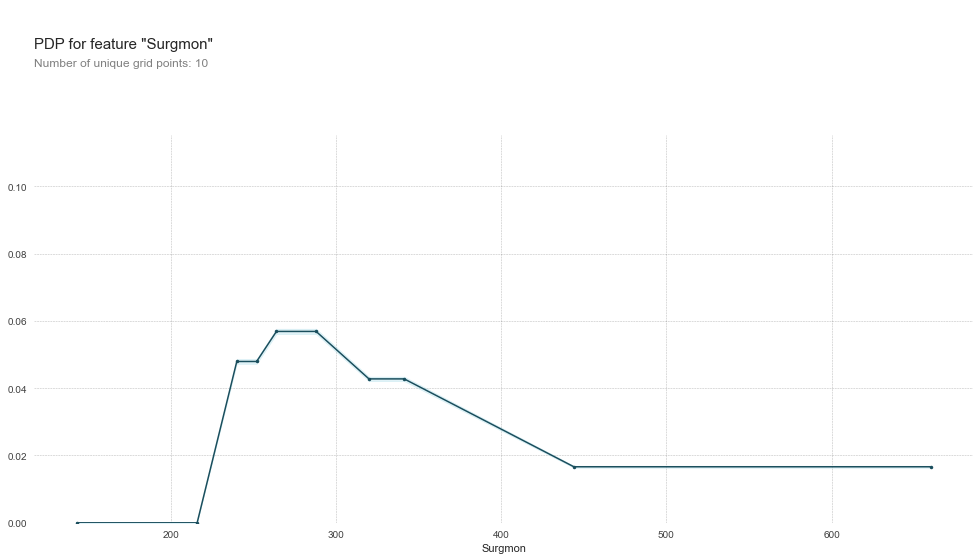

In [41]:
from pdpbox import pdp,info_plots

base_features = df.columns.values.tolist()
base_features.remove('oneyr')

feat_name = 'Surgmon'
pdp_dist = pdp.pdp_isolate(model=tuned_adaboost, dataset=X_test, model_features=base_features, feature=feat_name)

pdp.pdp_plot(pdp_dist, feat_name)
plt.show()

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

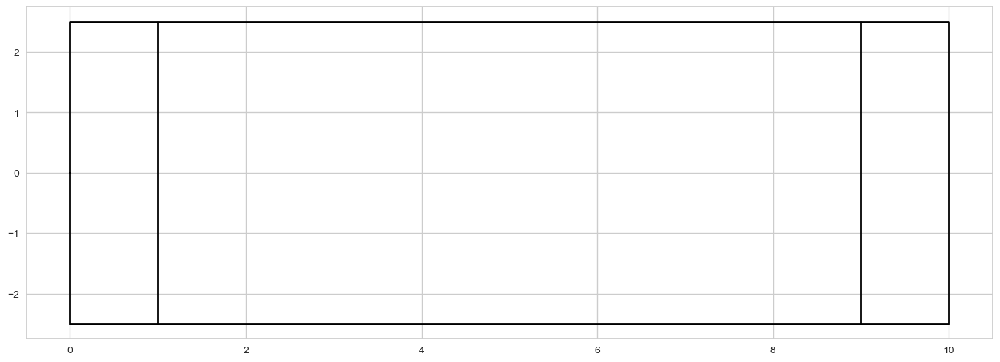

In [22]:
evaluate_model(tuned_adaboost)

In [23]:
# Partial Dependence Plot
# interpret model
interpret_model(tuned_adaboost, plot = 'pdp')

In [40]:
interpret_model(tuned_adaboost, plot = 'pdp', feature = 'Lat_radscore')

In [42]:
# interpret model
interpret_model(tuned_adaboost, plot = 'correlation')

TypeError: This function only supports tree based models for binary classification: rf, lightgbm, et, xgboost, dt.

In [43]:
# deep check model
deep_check(tuned_adaboost)

Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_XAJI0Y6DPBHSAHXTHV3A3ZMF8">Full S…

In [30]:
interpret_model(tuned_adaboost, plot = 'pfi')

17it [00:00, 39.12it/s]


In [46]:
from sklearn.ensemble import AdaBoostClassifier
import shap
shap.initjs()

#计算测试集每个样本的每个特征对两类预测结果的shap值
# explainer = shap.TreeExplainer(tuned_adaboost)
ADABoost = AdaBoostClassifier()
ADABoost.fit(X_train, y_train) 

shap_values = shap.TreeExplainer(tuned_adaboost).shap_values(X_test)
shap.summary_plot(shap_values,X_test,plot_type="violin") # "bar"

InvalidModelError: Model type not yet supported by TreeExplainer: <class 'sklearn.ensemble._weight_boosting.AdaBoostClassifier'>

In [33]:
interpret_model(tuned_adaboost, plot = 'reason')

TypeError: This function only supports tree based models for binary classification: rf, lightgbm, et, xgboost, dt.

In [34]:
interpret_model(tuned_adaboost, plot = 'reason', observation = 1)

TypeError: This function only supports tree based models for binary classification: rf, lightgbm, et, xgboost, dt.

In [35]:
interpret_model(tuned_adaboost, use_train_data = True)

TypeError: This function only supports tree based models for binary classification: rf, lightgbm, et, xgboost, dt.

In [36]:
# launch eda
eda(display_format = 'bokeh')

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (234, 18)
#######################################################################################
######################## C L A S S I

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
AI_radscore,234,float64,0,0.000000,100.000000,0,
Lat_radscore,234,float64,0,0.000000,100.000000,0,
Durmon,55,float64,0,0.000000,23.504274,0,
Surgmon,50,float64,0,0.000000,21.367521,0,
Onsetmon,50,float64,0,0.000000,21.367521,0,skewed: cap or drop outliers
Freq,4,float64,0,0.000000,1.709402,0,
familial_epilepsy,2,float64,0,0.000000,0.854701,0,skewed: cap or drop outliers
history_of_previous_surgery,2,float64,0,0.000000,0.854701,0,skewed: cap or drop outliers
traumatic_brain_injury,2,float64,0,0.000000,0.854701,0,skewed: cap or drop outliers
Central_Nervous_System_Infections,2,float64,0,0.000000,0.854701,0,skewed: cap or drop outliers


    17 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################


Row
    [0] WidgetBox
        [0] Select(name='y', options=['AI_radscore', ...], value='AI_radscore')
    [1] ParamFunction(function)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['AI_radscore', ...], value='AI_radscore')
        [1] Select(name='Y-Axis', options=['AI_radscore', ...], value='Lat_radscore')
        [2] Select(name='Color', options=['None', 'oneyr'], value='None')
    [1] ParamFunction(function)

Column
    [0] Row
        [0] HoloViews(DynamicMap)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['side', 'Sex', ...], value='side', width=250)
            [1] VSpacer()

Column
    [0] Row
        [0] HoloViews(DynamicMap)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['AI_radscore', ...], value='AI_radscore', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Layout)

No date vars could be found in data set


HoloViews(Overlay)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['side', 'Sex', ...], value='side')
        [1] Select(name='Y-Axis', options=['AI_radscore', ...], value='AI_radscore')
    [1] ParamFunction(function)

Time to run AutoViz (in seconds) = 2


Shape of your Data Set loaded: (234, 18)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
AI_radscore,234,float64,0,0.000000,100.000000,0,
Lat_radscore,234,float64,0,0.000000,100.000000,0,
Durmon,55,float64,0,0.000000,23.504274,0,
Surgmon,50,float64,0,0.000000,21.367521,0,
Onsetmon,50,float64,0,0.000000,21.367521,0,skewed: cap or drop outliers
Freq,4,float64,0,0.000000,1.709402,0,
familial_epilepsy,2,float64,0,0.000000,0.854701,0,skewed: cap or drop outliers
history_of_previous_surgery,2,float64,0,0.000000,0.854701,0,skewed: cap or drop outliers
traumatic_brain_injury,2,float64,0,0.000000,0.854701,0,skewed: cap or drop outliers
Central_Nervous_System_Infections,2,float64,0,0.000000,0.854701,0,skewed: cap or drop outliers


    17 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################
Total Number of Scatter Plots = 21
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 7 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


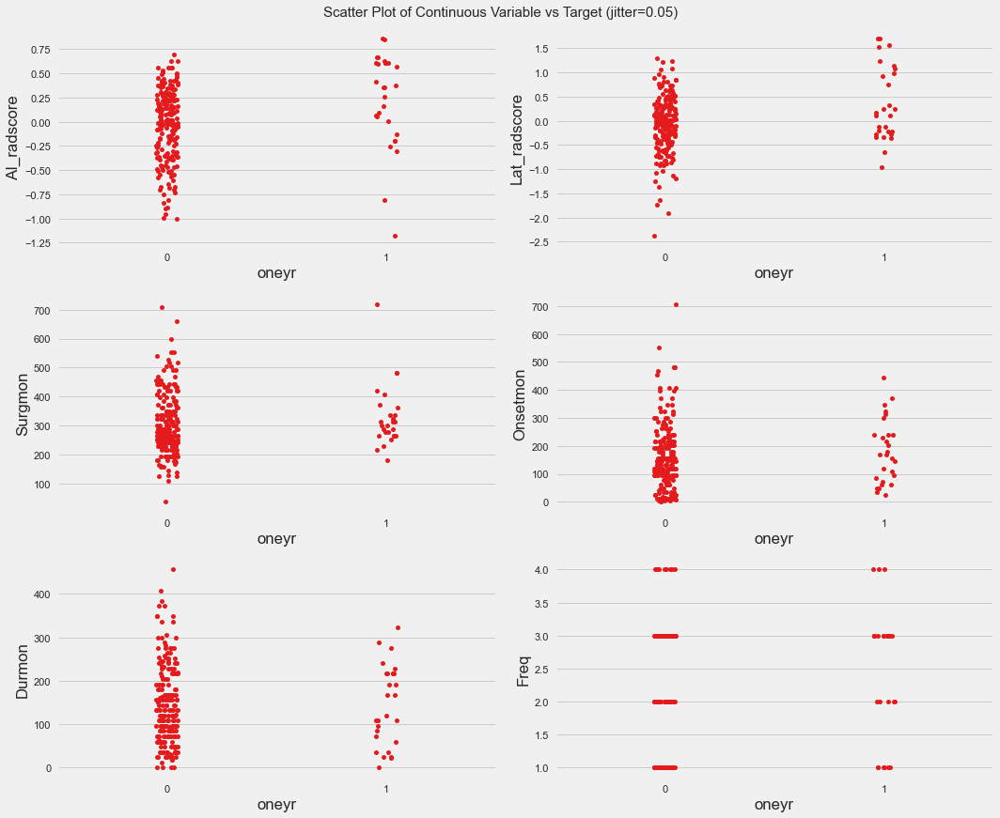

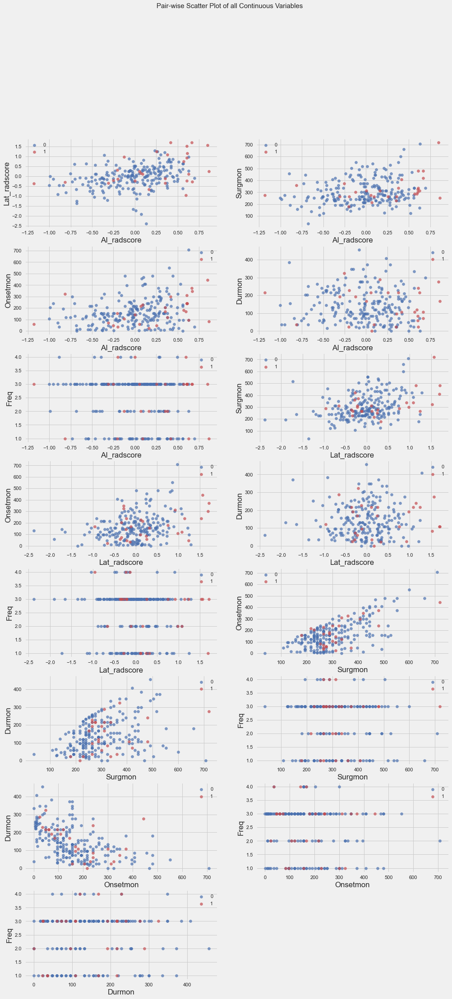

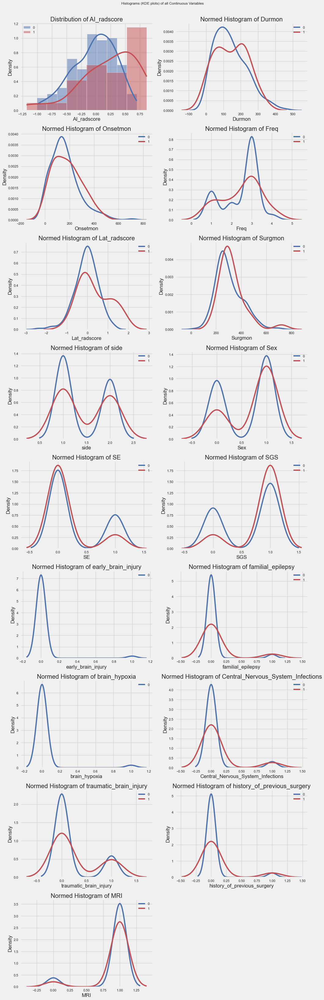

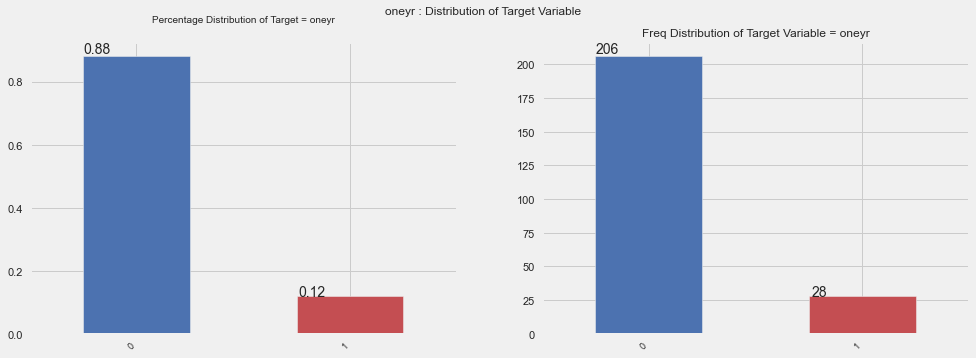

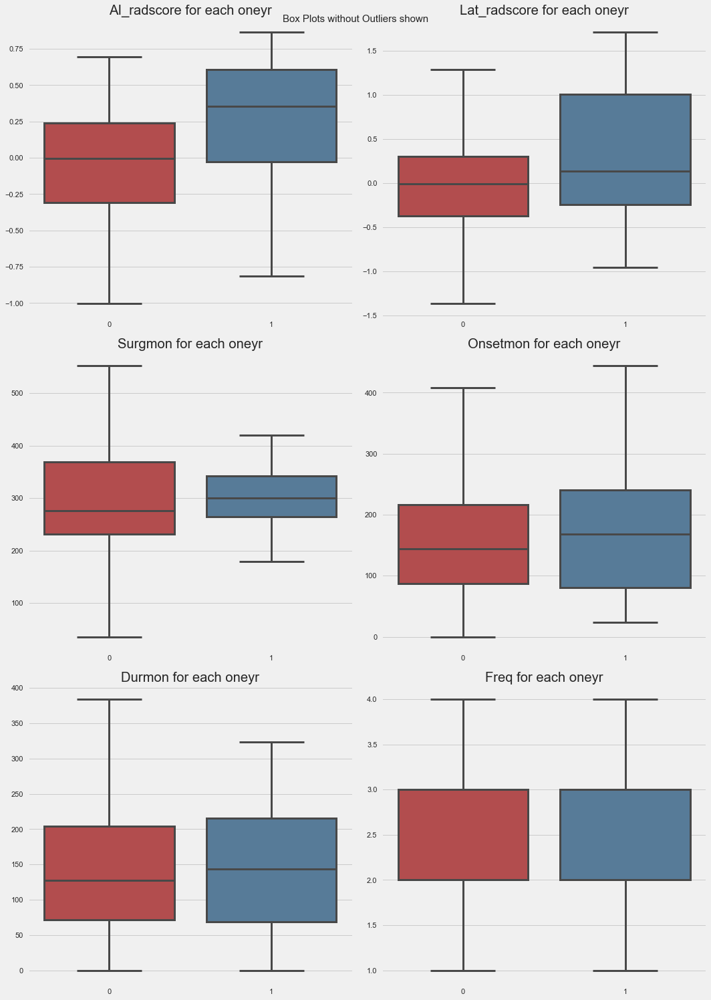

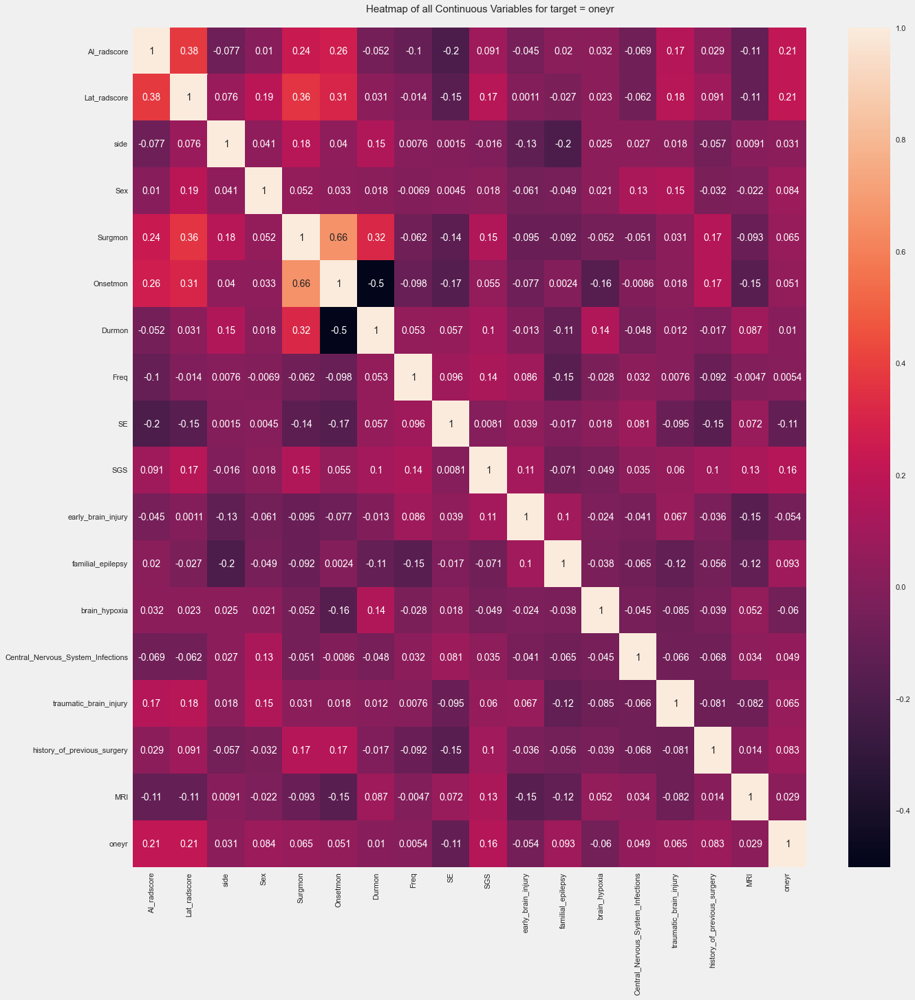

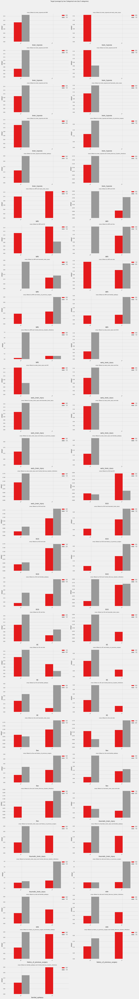

In [37]:
# launch eda
eda(display_format = 'svg')

In [ ]:
# check model fairness
lr_fairness = check_fairness(lr, sensitive_features = ['Sex', 'side'])

In [38]:
# compare models
top3 = compare_models(n_select = 3)

# tune top 3 models
tuned_top3 = [tune_model(i) for i in top3]

# ensemble top 3 tuned models
ensembled_top3 = [ensemble_model(i) for i in tuned_top3]

# blender
blender = blend_models(tuned_top3)

# stacker
stacker = stack_models(tuned_top3)

# check leaderboard
get_leaderboard()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8901,0.7619,0.3500,0.4833,0.3900,0.3464,0.3600,0.1160
rf,Random Forest Classifier,0.8838,0.7633,0.2000,0.3500,0.2500,0.2169,0.2297,0.4520
lda,Linear Discriminant Analysis,0.8838,0.6424,0.1000,0.2000,0.1333,0.1188,0.1275,0.0440
xgboost,Extreme Gradient Boosting,0.8838,0.7774,0.3000,0.4000,0.3333,0.2871,0.2945,0.2680
et,Extra Trees Classifier,0.8835,0.6617,0.1000,0.2000,0.1333,0.1182,0.1269,0.1940
ada,Ada Boost Classifier,0.8831,0.7886,0.4000,0.4333,0.3933,0.3450,0.3569,0.1200
lr,Logistic Regression,0.8776,0.6621,0.0500,0.1000,0.0667,0.0551,0.0592,0.0990
ridge,Ridge Classifier,0.8772,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0340
dummy,Dummy Classifier,0.8772,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0400
svm,SVM - Linear Kernel,0.8654,0.0000,0.0000,0.0000,0.0000,-0.0133,-0.0133,0.0330


Processing:   0%|          | 0/67 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8235,0.5667,0.0000,0.0000,0.0000,-0.0851,-0.0913
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.7647,0.3333,0.0000,0.0000,0.0000,-0.1333,-0.1333
3,0.8750,0.8214,0.5000,0.5000,0.5000,0.4286,0.4286
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9375,0.9286,0.5000,1.0000,0.6667,0.6364,0.6831
6,0.8125,0.7857,0.0000,0.0000,0.0000,-0.0909,-0.0976
7,0.9375,0.9286,0.5000,1.0000,0.6667,0.6364,0.6831
8,0.9375,1.0000,0.5000,1.0000,0.6667,0.6364,0.6831


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8235,0.7000,0.0000,0.0000,0.0000,-0.0851,-0.0913
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.7647,0.5000,0.0000,0.0000,0.0000,-0.1333,-0.1333
3,0.8750,0.7500,0.5000,0.5000,0.5000,0.4286,0.4286
4,0.8125,0.8929,0.5000,0.3333,0.4000,0.2941,0.3026
5,0.8750,0.9643,1.0000,0.5000,0.6667,0.6000,0.6547
6,0.9375,0.7857,0.5000,1.0000,0.6667,0.6364,0.6831
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8235,0.5333,0.0000,0.0000,0.0000,-0.0851,-0.0913
1,0.8824,0.9667,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.8824,0.5667,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.8750,0.6071,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8750,0.3571,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9375,0.8214,0.5000,1.0000,0.6667,0.6364,0.6831
6,0.8750,0.3929,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9375,0.6071,0.5000,1.0000,0.6667,0.6364,0.6831
8,0.8750,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8235,0.6000,0.0000,0.0000,0.0000,-0.0851,-0.0913
1,0.9412,1.0000,0.5000,1.0000,0.6667,0.6383,0.6847
2,0.7647,0.3667,0.0000,0.0000,0.0000,-0.1333,-0.1333
3,0.8750,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9375,1.0000,0.5000,1.0000,0.6667,0.6364,0.6831
5,0.9375,0.8929,0.5000,1.0000,0.6667,0.6364,0.6831
6,0.8750,0.5714,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9375,0.7500,0.5000,1.0000,0.6667,0.6364,0.6831
8,0.9375,1.0000,0.5000,1.0000,0.6667,0.6364,0.6831


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8235,0.6000,0.0000,0.0000,0.0000,-0.0851,-0.0913
1,0.8824,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.8235,0.3667,0.0000,0.0000,0.0000,-0.0851,-0.0913
3,0.8750,0.8929,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8750,0.9286,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9375,0.9643,0.5000,1.0000,0.6667,0.6364,0.6831
6,0.8750,0.6786,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.8750,0.9286,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.8750,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8824,0.4667,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.8235,0.9333,0.0000,0.0000,0.0000,-0.0851,-0.0913
2,0.8824,0.7000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.8750,0.6429,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8750,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9375,0.7857,0.5000,1.0000,0.6667,0.6364,0.6831
6,0.8750,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9375,0.6071,0.5000,1.0000,0.6667,0.6364,0.6831
8,0.8750,0.9286,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8235,0.3667,0.0000,0.0000,0.0000,-0.0851,-0.0913
1,0.9412,1.0000,0.5000,1.0000,0.6667,0.6383,0.6847
2,0.8235,0.3667,0.0000,0.0000,0.0000,-0.0851,-0.0913
3,0.8750,0.7143,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8750,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9375,0.8214,0.5000,1.0000,0.6667,0.6364,0.6831
6,0.8750,0.6786,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9375,0.8214,0.5000,1.0000,0.6667,0.6364,0.6831
8,0.9375,1.0000,0.5000,1.0000,0.6667,0.6364,0.6831


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8235,0.5000,0.0000,0.0000,0.0000,-0.0851,-0.0913
1,0.9412,1.0000,0.5000,1.0000,0.6667,0.6383,0.6847
2,0.8824,0.4667,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.8750,0.5714,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8750,0.3571,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9375,0.8214,0.5000,1.0000,0.6667,0.6364,0.6831
6,0.8750,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9375,0.8929,0.5000,1.0000,0.6667,0.6364,0.6831
8,0.8750,0.9643,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,14:18:22
Status,. . . . . . . . . . . . . . . . . .,Creating dataframe
Estimator,. . . . . . . . . . . . . . . . . .,Stacking Classifier


Processing:   0%|          | 0/45 [00:00<?, ?it/s]

Model Name  \
Index                                    
0                  Logistic Regression   
1               K Neighbors Classifier   
2                          Naive Bayes   
3             Decision Tree Classifier   
4                  SVM - Linear Kernel   
5                     Ridge Classifier   
6             Random Forest Classifier   
7      Quadratic Discriminant Analysis   
8                 Ada Boost Classifier   
9         Gradient Boosting Classifier   
10        Linear Discriminant Analysis   
11              Extra Trees Classifier   
12           Extreme Gradient Boosting   
13     Light Gradient Boosting Machine   
14                    Dummy Classifier   
15                Ada Boost Classifier   
16                Ada Boost Classifier   
17                Ada Boost Classifier   
18                 Logistic Regression   
19              K Neighbors Classifier   
20                         Naive Bayes   
21            Decision Tree Classifier   
22                 SVM - Linear Kernel   
23                    Ridge Classifier   
24            Random Forest Classifier   
25     Quadratic Discriminant Analysis   
26                Ada Boost Classifier   
27        Gradient Boosting Classifier   
28        Linear Discriminant Analysis   
29              Extra Trees Classifier   
30           Extreme Gradient Boosting   
31     Light Gradient Boosting Machine   
32                    Dummy Classifier   
33        Gradient Boosting Classifier   
34        Gradient Boosting Classifier   
35            Random Forest Classifier   
36            Random Forest Classifier   
37        Linear Discriminant Analysis   
38        Linear Discriminant Analysis   
39        Gradient Boosting Classifier   
40            Random Forest Classifier   
41        Linear Discriminant Analysis   
42                   Voting Classifier   
43                 Stacking Classifier   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

In [23]:
# train decision tree
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,APC
Fold,,,,,,,,
0,0.8235,0.5667,0.0000,0.0000,0.0000,-0.0851,-0.0913,0.2436
1,0.8824,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
2,0.8824,0.7333,0.0000,0.0000,0.0000,0.0000,0.0000,0.2917
3,0.8750,0.6071,0.0000,0.0000,0.0000,0.0000,0.0000,0.2576
4,0.8750,0.3214,0.0000,0.0000,0.0000,0.0000,0.0000,0.1333
5,0.9375,0.7857,0.5000,1.0000,0.6667,0.6364,0.6831,0.6250
6,0.8750,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.5625
7,0.8750,0.7857,0.0000,0.0000,0.0000,0.0000,0.0000,0.6250
8,0.8750,0.9286,0.0000,0.0000,0.0000,0.0000,0.0000,0.5833


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,APC
0,Ada Boost Classifier,0.8169,0.5198,0.1250,0.1429,0.1333,0.0315,0.0316,0.1817


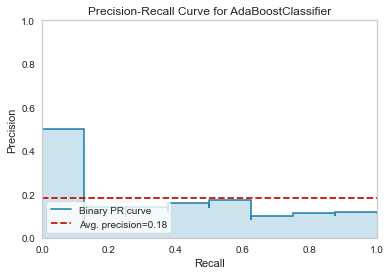

In [26]:
# 预测标签及概率
from sklearn.metrics import average_precision_score
# add_metric('apc', 'APC', average_precision_score, target = 'pred_proba')

# rf = create_model('rf') #lr/dt/rf/gbc

predict_model(ada);
plot_model(ada, plot = 'pr')

In [57]:
lr_out = lr.predict_proba(X_test)

In [18]:
predictions = predict_model(lr, data=df)
predictions
predictions.to_csv('/home/wane/Desktop/EP/REFER/BLS/KAI/lr_score.csv')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9539,0.9826,0.9444,0.9866,0.9651,0.8974,0.8992


In [9]:
evaluate_model(ada)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

ValueError: Plot Not Available. Please see docstring for list of available Plots.

In [21]:
# summary plot
interpret_model(ada)
# correlation plot
# interpret_model(lr, plot = 'correlation')

TypeError: This function only supports tree based models for binary classification: dt, xgboost, lightgbm, rf, et.

In [11]:
# calibrate a model
calibrated_dt = calibrate_model(ada)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,APC
Fold,,,,,,,,
0,0.8824,0.6333,0.0000,0.0000,0.0000,0.0000,0.0000,0.2250
1,0.8824,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
2,0.8235,0.5667,0.0000,0.0000,0.0000,-0.0851,-0.0913,0.2083
3,0.8750,0.9286,0.0000,0.0000,0.0000,0.0000,0.0000,0.5833
4,0.8750,0.8929,0.0000,0.0000,0.0000,0.0000,0.0000,0.7000
5,0.8750,0.9643,0.0000,0.0000,0.0000,0.0000,0.0000,0.8333
6,0.8750,0.6429,0.0000,0.0000,0.0000,0.0000,0.0000,0.2667
7,0.8750,0.8214,0.0000,0.0000,0.0000,0.0000,0.0000,0.6429
8,0.8750,0.9643,0.0000,0.0000,0.0000,0.0000,0.0000,0.8333


In [ ]:
# 4.创建模型
params = {"max_depth": 2,
          'n_estimators':800,
          'learning_rate':0.05,
         'subsample':0.8, 
          'colsample_bytree':0.8}
lgb = create_model('lightgbm',**params) #默认是setup函数设置的fold

In [ ]:
# train multiple models
multiple_models = [create_model(i) for i in ['dt', 'lr', 'xgboost']]

In [12]:
# 5.调整模型,模型调参
lgb_tune = tune_model(gbc,optimize = 'AUC',
                      search_library = 'scikit-optimize',search_algorithm = 'bayesian')   

ModuleNotFoundError: 
'skopt' is a soft dependency and not included in the pycaret installation. Please run: `pip install scikit-optimize` to install.
Alternately, you can install this by running `pip install pycaret[tuners]`

In [22]:
tuned_adaboost = tune_model(ada)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,APC
Fold,,,,,,,,
0,0.8824,0.7333,0.0000,0.0000,0.0000,0.0000,0.0000,0.3611
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.8235,0.5500,0.0000,0.0000,0.0000,-0.0851,-0.0913,0.1833
3,0.8750,0.8929,0.0000,0.0000,0.0000,0.0000,0.0000,0.5000
4,0.9375,0.9286,0.5000,1.0000,0.6667,0.6364,0.6831,0.7500
5,0.9375,0.9643,0.5000,1.0000,0.6667,0.6364,0.6831,0.8333
6,0.8750,0.5536,0.0000,0.0000,0.0000,0.0000,0.0000,0.3214
7,0.9375,0.9643,0.5000,1.0000,0.6667,0.6364,0.6831,0.8333
8,0.9375,1.0000,0.5000,1.0000,0.6667,0.6364,0.6831,1.0000


Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [14]:
tuned_gbcboost = tune_model(gbc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9412,0.9667,1.0000,0.6667,0.8000,0.7671,0.7888
1,0.8235,0.5000,0.0000,0.0000,0.0000,-0.0851,-0.0913
2,0.8235,0.6667,0.0000,0.0000,0.0000,-0.0851,-0.0913
3,0.7500,0.6786,0.5000,0.2500,0.3333,0.2000,0.2182
4,0.8750,0.7143,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9375,0.5357,0.5000,1.0000,0.6667,0.6364,0.6831
6,0.8125,0.7857,0.5000,0.3333,0.4000,0.2941,0.3026
7,0.7500,0.5714,0.0000,0.0000,0.0000,-0.1429,-0.1429
8,0.6250,0.3929,0.0000,0.0000,0.0000,-0.2000,-0.2182


Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [59]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,APC
Fold,,,,,,,,
0,0.9444,1.0000,0.9167,1.0000,0.9565,0.8800,0.8864,1.0000
1,0.9444,1.0000,1.0000,0.9231,0.9600,0.8696,0.8771,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.8824,0.9167,0.8333,1.0000,0.9091,0.7463,0.7715,0.9722
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9412,1.0000,0.9167,1.0000,0.9565,0.8661,0.8740,1.0000
6,0.8824,0.8667,0.8333,1.0000,0.9091,0.7463,0.7715,0.9569
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,0.9412,1.0000,0.9167,1.0000,0.9565,0.8661,0.8740,1.0000


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [ ]:
# for循环调参 
tuned = [tune_model(i) for i in best]

In [ ]:
# 6.集成模型
# creating a decision tree model
dt = create_model('dt')
# ensembling a trained dt model
dt_bagged = ensemble_model(dt)

In [ ]:
# 7.显示模型
# create a model
adaboost = create_model('ada')
# AUC plot
plot_model(adaboost, plot = 'auc')
# Decision Boundary
plot_model(adaboost, plot = 'boundary')
# Precision Recall Curve
plot_model(adaboost, plot = 'pr')
# Validation Curve
plot_model(adaboost, plot = 'vc')

In [23]:
# evaluate_model(gbcboost)
evaluate_model(tuned_ada)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [37]:
plot_model(ada, plot = 'manifold', save=True)

'Manifold Learning.png'

In [ ]:
predictions = predict_model(best_model, data = df)
predictions

In [ ]:
# 8.解释模型
# create a model
xgboost = create_model('xgboost')
# summary plot
interpret_model(xgboost)
# correlation plot
interpret_model(xgboost, plot = 'correlation')

In [16]:
# interpret_model(xgboost, plot = 'reason', observation = 0)
interpret_model()

ModuleNotFoundError: 
'shap' is a soft dependency and not included in the pycaret installation. Please run: `pip install shap` to install.
Alternately, you can install this by running `pip install pycaret[analysis]`

In [ ]:
# 9.预测模型
# create a model
rf = create_model('rf')
# predict test / hold-out dataset
rf_holdout_pred = predict_model(rf)

In [ ]:
predictions = predict_model(rf, data = df)

In [ ]:
# 10.部署模型
deploy_model(model = rf, model_name = 'rf_aws', 
             platform = 'aws',authentication =  {'bucket'  : 'pycaret-test'})

In [ ]:
# 11.保存模型/保存实验
# creating model
adaboost = create_model('ada')
# saving model
save_model(adaboost, model_name = 'ada_for_deployment')

In [ ]:
save_experiment(experiment_name = 'my_first_experiment')

Classification: Accuracy, AUC, Recall, Precision, F1, Kappa, MCC
Regression: MAE, MSE, RMSE, R2, RMSLE, MAPE

In [17]:
# 三、模型可视化分析
# 1.性能分析(plot_model)
plot_model(lr, plot = 'auc')
plot_model(lr, plot = 'threshold')
plot_model(lr, plot = 'confusion_matrix')
plot_model(lr, plot = 'pr')
plot_model(lr, plot = 'vc')

ValueError: X has 13 features, but LogisticRegression is expecting 14 features as input.

<Figure size 800x550 with 0 Axes>

In [16]:
# 保存pdf
# plot_model(lr, plot = 'auc', save=True)

exp_reg101 = setup(data = df, target = 'Label', session_id=123, 
                   remove_multicollinearity = True, multicollinearity_threshold = 0.95) 

lightgbm = create_model('lr')

#---- plot
from yellowbrick.regressor import ResidualsPlot

X_train, X_test, y_train, y_test = get_config('X_train'), get_config('X_test'), get_config('y_train'), get_config('y_test')

visualizer = ResidualsPlot(lightgbm) # regression model
visualizer.fit(X_train, y_train) # Fit the training data to the visualizer
visualizer.score(X_test, y_test) # Evaluate the model on the test data
visualizer.poof(outpath="ResidualsPlot.pdf") # VECTOR .pdf .eps .svg, RASTER .png .jpg .tif
#visualizer.poof()  # Finalize and render the figure

#---- file extensions supported
import matplotlib.pyplot as plt
plt.figure().canvas.get_supported_filetypes()

,Description,Value
0,Session id,123
1,Target,Label
2,Target type,Multiclass
3,Target mapping,"CN: 0, Left: 1, Right: 2"
4,Original data shape,"(347, 15)"
5,Transformed data shape,"(347, 14)"
6,Transformed train set shape,"(242, 14)"
7,Transformed test set shape,"(105, 14)"
8,Numeric features,14
9,Preprocess,True


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8000,0.8720,0.8000,0.7944,0.7812,0.6914,0.7040
1,0.8400,0.9041,0.8400,0.8444,0.8404,0.7585,0.7603
2,0.6667,0.8605,0.6667,0.6729,0.6493,0.4921,0.5042
3,0.7917,0.8749,0.7917,0.8611,0.7897,0.6685,0.7088
4,0.8750,0.9788,0.8750,0.8802,0.8755,0.8125,0.8146
5,0.7917,0.8778,0.7917,0.7969,0.7925,0.6875,0.6893
6,0.8333,0.8876,0.8333,0.8399,0.8281,0.7513,0.7592
7,0.7917,0.9296,0.7917,0.7917,0.7897,0.6875,0.6893
8,0.9167,0.9474,0.9167,0.9167,0.9167,0.8743,0.8743


YellowbrickTypeError: This estimator is not a regressor; try a classifier or clustering score visualizer instead!

In [ ]:
# 2.解释性分析(interpret_model)
interpret_model(gbcoost)
interpret_model(gbcoost, plot = 'correlation')
interpret_model(gbcoost, plot = 'reason', observation = 10)

In [ ]:
# 3.模型校准(calibrate_model)
calibrated_dt = calibrate_model(dt)

In [ ]:
# 4.阈值优化（optimize_threshold）
optimize_threshold(xgboost, true_negative = 1500, false_negative = -5000)

In [ ]:
# 四、模型预测


In [ ]:
# 五、模型保存/加载
# 1.最终模型

In [ ]:
# 2.模型保存

In [ ]:
# 六、模型部署

https://github.com/pycaret/pycaret/blob/master/tutorials/Regression%20Tutorial%20Level%20Beginner%20-%20REG101.ipynb

In [4]:
# 1.获取数据
# from pycaret.datasets import get_data
# diabetes = get_data('diabetes')

# 使用Pandas加载CSV
from pandas import read_csv

df = read_csv('/home/wane/Desktop/TBS/Monkey/VoxelNumbers_InMachin_atlas_whole.csv')

df = df.iloc[:,9:]
df.head()

,Age,Gender,TBV/BW,CSF/TBV,WM/TBV,GM/TBV
0,1,0,32.235503,0.132386,0.333766,0.533848
1,1,0,30.250440,0.132589,0.335212,0.532199
2,1,0,32.447900,0.132242,0.335673,0.532085
3,1,0,31.646702,0.131594,0.335652,0.532754
4,1,0,33.040488,0.132185,0.335810,0.532005


In [5]:
# check the shape of data
df.shape

(225, 6)

In [6]:
# split data
data = df.sample(frac=0.7, random_state=123)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (158, 6)
Unseen Data For Predictions: (67, 6)


In [7]:
# 5.0 Setting up Environment in PyCaret
from pycaret.regression import *
exp_reg102 = setup(data = data, target = 'Age', session_id=123, fold_shuffle=True,
                  normalize = True, transformation = True, transform_target = True, 
                  combine_rare_levels = True, rare_level_threshold = 0.05,
                  remove_multicollinearity = True, multicollinearity_threshold = 0.95)

TypeError: setup() got an unexpected keyword argument 'combine_rare_levels'

In [8]:
# 6.0 Setting up Environment in PyCaret
from pycaret.regression import *
exp_reg101 = setup(data = data, target = 'Age',  fold_shuffle=True, session_id=123) 

,Description,Value
0,Session id,123
1,Target,Age
2,Target type,Regression
3,Data shape,"(158, 6)"
4,Train data shape,"(110, 6)"
5,Test data shape,"(48, 6)"
6,Numeric features,5
7,Preprocess,True
8,Imputation type,simple
9,Numeric imputation,mean


In [9]:
# 7.0 Comparing All Models
best = compare_models(exclude = ['ransac'], n_select = 5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,4.2291,35.1662,5.7667,0.4262,0.4535,0.5158,0.0190
knn,K Neighbors Regressor,4.2709,33.8149,5.6245,0.4180,0.4698,0.5593,0.0060
lightgbm,Light Gradient Boosting Machine,4.5950,36.1767,5.8262,0.4091,0.5319,0.6831,0.0080
ridge,Ridge Regression,5.2719,39.0636,6.2124,0.3681,0.5541,0.7615,0.0050
br,Bayesian Ridge,5.2784,39.1902,6.2238,0.3657,0.5527,0.7581,0.0050
lr,Linear Regression,5.3269,39.4683,6.2279,0.3652,0.5619,0.8322,0.1860
lar,Least Angle Regression,5.3271,39.4706,6.2282,0.3652,0.5620,0.8322,0.0050
huber,Huber Regressor,5.2382,39.8545,6.2744,0.3569,0.5247,0.7226,0.0050
rf,Random Forest Regressor,4.5180,39.0763,6.0715,0.3412,0.5181,0.6050,0.0210
ada,AdaBoost Regressor,4.9921,40.8556,6.2631,0.3271,0.5480,0.7341,0.0110


In [10]:
# 8.0 Create a Model
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [11]:
# 8.1 AdaBoost Regressor
knn = create_model('knn')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4.6909,38.1527,6.1768,0.4028,0.4149,0.3671
1,2.7818,15.9527,3.9941,0.7523,0.3673,0.4396
2,3.0182,18.8073,4.3367,0.7208,0.3799,0.3967
3,3.6909,19.7564,4.4448,0.6808,0.4489,0.5643
4,6.5455,74.5455,8.6340,-0.8363,0.5745,0.6070
5,5.7636,42.5127,6.5202,0.2881,0.5617,0.7997
6,3.4909,20.8655,4.5679,0.6909,0.4411,0.5774
7,4.9273,46.8473,6.8445,0.4026,0.5763,0.7897
8,4.8909,43.8945,6.6253,0.3314,0.5673,0.6422


In [12]:
# 8.2 Light Gradient Boosting Machine
lightgbm = create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4.8074,45.8248,6.7694,0.2827,0.4883,0.3975
1,4.0354,34.8103,5.9000,0.4596,0.5445,0.7318
2,3.4164,20.9265,4.5746,0.6893,0.6112,0.5238
3,5.8664,42.4412,6.5147,0.3142,0.6711,1.0734
4,5.9701,51.3009,7.1625,-0.2637,0.4999,0.5238
5,2.6170,10.8160,3.2888,0.8189,0.2571,0.2784
6,6.2596,63.5966,7.9747,0.0579,0.6884,1.0591
7,5.6890,52.4769,7.2441,0.3308,0.6239,0.9527
8,3.3774,15.0941,3.8851,0.7701,0.3425,0.3877


In [13]:
# 8.3 Decision Tree
dt = create_model('dt')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,6.0000,86.7273,9.3127,-0.3576,0.7857,0.3774
1,3.2727,31.2727,5.5922,0.5145,0.4925,0.5166
2,1.8182,11.8182,3.4378,0.8245,0.2232,0.1903
3,2.8182,19.5455,4.4210,0.6842,0.3547,0.2954
4,7.7273,109.1818,10.4490,-1.6895,0.8073,0.6635
5,2.4545,16.4545,4.0564,0.7245,0.3835,0.3497
6,5.0909,44.3636,6.6606,0.3428,0.4853,0.6461
7,3.1818,37.9091,6.1570,0.5165,0.4108,0.1655
8,4.9091,65.2727,8.0792,0.0058,0.7009,0.8532


In [14]:
# 8.4 Random Forest Regressor
rf = create_model('rf')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4.7336,52.0722,7.2161,0.1849,0.5119,0.3702
1,3.6973,26.9213,5.1886,0.5821,0.4288,0.5208
2,2.7500,13.9806,3.7391,0.7924,0.3094,0.3129
3,3.7182,23.9187,4.8907,0.6135,0.4729,0.5848
4,6.6000,77.5458,8.8060,-0.9102,0.6618,0.5919
5,4.1327,23.0773,4.8039,0.6136,0.4889,0.6355
6,4.8945,44.0579,6.6376,0.3473,0.5260,0.7002
7,5.1382,60.1881,7.7581,0.2324,0.6008,0.6056
8,4.2682,26.9039,5.1869,0.5902,0.4211,0.4491


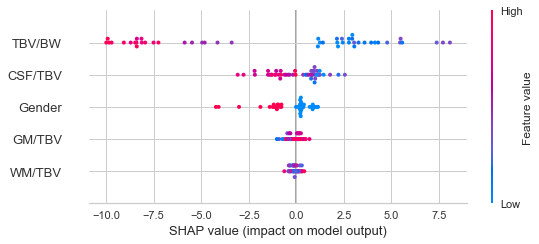

In [15]:
interpret_model(rf)

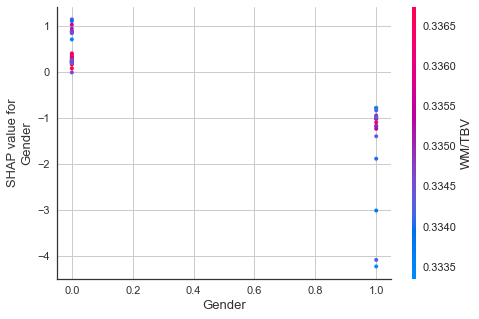

In [16]:
interpret_model(rf, plot='correlation')

In [ ]:
interpret_model(rf, plot = 'reason', observation = 10)

In [ ]:
plot_model(rf, plot = 'boundary')

In [ ]:
# 9.0 Tune a Model
# 9.1 AdaBoost Regressor
tuned_knn = tune_model(knn)

In [ ]:
print(tuned_knn)

In [ ]:
# 9.2 Light Gradient Boosting Machine
import numpy as np
lgbm_params = {'num_leaves': np.arange(10,200,10),
                        'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
                        'learning_rate': np.arange(0.1,1,0.1)
                        }

In [ ]:
tuned_lightgbm = tune_model(lightgbm, custom_grid = lgbm_params)

In [ ]:
print(tuned_lightgbm)

In [ ]:
# 9.3 Decision Tree
tuned_dt = tune_model(dt)

In [ ]:
# 9.4 Random Forest Regressor
tuned_rf = tune_model(rf)

In [ ]:
tuned = [tune_model(i) for i in best]

In [ ]:
# Bagging
bagged = [ensemble_model(i) for i in tuned]

In [ ]:
# Blending
blender = blend_models(estimator_list = tuned)

In [ ]:
# 10.0 Plot a Model
# 10.1 Residual Plot
plot_model(tuned_knn)

In [ ]:
# 10.2 Prediction Error Plot
plot_model(tuned_knn, plot = 'error')

In [ ]:
# 10.3 Feature Importance Plot
plot_model(tuned_knn, plot='feature')

In [ ]:
evaluate_model(tuned_knn)

In [ ]:
# 11.0 Predict on Test / Hold-out Sample
predict_model(tuned_knn);

In [ ]:
# 12.0 Finalize Model for Deployment
final_knn = finalize_model(tuned_knn)
print(final_knn)

In [ ]:
predict_model(final_knn);

In [ ]:
# 13.0 Predict on Unseen Data
unseen_predictions = predict_model(final_knn, data=data_unseen)
unseen_predictions.head()

In [ ]:
from pycaret.utils import check_metric
check_metric(unseen_predictions.TBVBW, unseen_predictions.Label, 'R2')

In [25]:
# 14.0 Save/Load/Deploy the Model
# save_model(final_knn,'Final_knn_Model_22Jun2022')
save_model(tuned_knn2, 'saved_final_knn')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=/tmp/joblib),
          steps=[('target_transformation',
                  TransformerWrapperWithInverse(transformer=TargetTransformer(estimator=PowerTransformer(standardize=False)))),
                 ('numerical_imputer',
                  TransformerWrapper(include=['Age', 'Gender'], transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=[], transformer=Simp...lue='constant', strategy='constant'))),
                 ('remove_multicollinearity',
                  TransformerWrapper(exclude=[], transformer=RemoveMulticollinearity(threshold=0.95))),
                 ('transformation',
                  TransformerWrapper(transformer=PowerTransformer(standardize=False))),
                 ('normalize', TransformerWrapper(transformer=StandardScaler())),
                 ['trained_model', KNeighborsRegressor(n_jobs=-1)]]),
 'saved_final_knn.pkl')

In [ ]:
from pycaret.regression import load_model
saved_lr = load_model('saved_lr_model')

In [ ]:
# 15.0 Loading the Saved Model
loaded_pipeline = load_model('Final_knn_Model_22Jun2022')

In [ ]:
# using sklearn set_config display pipeline as diagram
from sklearn  import set_config
set_config(display='diagram')

# print pipeline 
loaded_pipeline

In [ ]:
# Deployment on AWS/Azure/GCP
# deploy model on AWS S3
deploy_model(best_final, 'insurance-pipeline-aws', platform = 'aws',
             authentication = {'bucket' : 'pycaret-test'})

In [ ]:
# load deployed model from AWS 
pipeline = load_model('insurance-pipeline-aws', platform = 'aws',
             authentication = {'bucket' : 'pycaret-test'})

In [ ]:
pipeline

In [ ]:
new_prediction = predict_model(loaded_pipeline, data=data_unseen)
new_prediction.head()

In [ ]:
from pycaret.utils import check_metric
check_metric(new_prediction.'TBVBW', new_prediction.Label, 'R2')

In [2]:
# 1.获取数据
# from pycaret.datasets import get_data
# diabetes = get_data('diabetes')

# 使用Pandas加载CSV
from pandas import read_csv

diabetes = read_csv('/home/wane/Desktop/TBS/Monkey/VoxelNumbers.csv')
df = diabetes.iloc[:,1:]
df.head()

,Age,Gender,TBVBW
0,1,0,32.235503
1,1,0,30.250440
2,1,0,32.447900
3,1,0,31.646702
4,1,0,33.040488


In [3]:
#check the shape of data
df.shape

(225, 3)

In [4]:
# 4.0 Getting the Data
data = df.sample(frac=0.7, random_state=123)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

Data for Modeling: (158, 3)
Unseen Data For Predictions (67, 3)


In [6]:
# 5.0 Setting up Environment in PyCaret
from pycaret.regression import *
exp_reg102 = setup(data = data, target = 'TBVBW', session_id=123, fold_shuffle=True,
                  normalize = True, transformation = True, transform_target = True, 
#                   combine_rare_levels = True, rare_level_threshold = 0.05,
                  remove_multicollinearity = True, multicollinearity_threshold = 0.95)

,Description,Value
0,Session id,123
1,Target,TBVBW
2,Target type,Regression
3,Data shape,"(158, 3)"
4,Train data shape,"(110, 3)"
5,Test data shape,"(48, 3)"
6,Numeric features,2
7,Preprocess,True
8,Imputation type,simple
9,Numeric imputation,mean


In [7]:
save_config('myvars.pkl')

In [8]:
from pycaret.regression import load_config
load_config('myvars.pkl')

In [9]:
# 6.0 Comparing All Models
top5 = compare_models(exclude = ['ransac'], n_select = 5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
knn,K Neighbors Regressor,2.0664,7.9660,2.7591,0.8030,0.1666,0.1329,0.0070
ada,AdaBoost Regressor,2.2175,8.3482,2.8243,0.7897,0.1742,0.1493,0.0090
rf,Random Forest Regressor,2.1888,8.4493,2.8581,0.7850,0.1741,0.1427,0.0230
dt,Decision Tree Regressor,2.2380,9.0533,2.9446,0.7712,0.1790,0.1480,0.0070
catboost,CatBoost Regressor,2.2411,9.1010,2.9535,0.7711,0.1795,0.1473,0.1460
gbr,Gradient Boosting Regressor,2.2746,9.2306,2.9707,0.7690,0.1825,0.1498,0.0090
et,Extra Trees Regressor,2.2404,9.2784,2.9767,0.7686,0.1808,0.1470,0.0180
lightgbm,Light Gradient Boosting Machine,2.3620,10.3437,3.0849,0.7512,0.1760,0.1477,0.0100
huber,Huber Regressor,3.7034,21.6338,4.5198,0.4700,0.2694,0.2473,0.0070
lar,Least Angle Regression,3.7285,22.1159,4.5673,0.4642,0.2694,0.2461,0.0080


In [10]:
type(top5)

list

In [11]:
print(top5)

[KNeighborsRegressor(n_jobs=-1), AdaBoostRegressor(random_state=123), RandomForestRegressor(n_jobs=-1, random_state=123), DecisionTreeRegressor(random_state=123), <catboost.core.CatBoostRegressor object at 0x7f359a269f10>]


In [ ]:
# 7.0 Create a Model
# 7.1 Create Model (with 5 Fold CV)
dt = create_model('dt', fold = 5)

In [ ]:
# 7.2 Create Model (Metrics rounded to 2 decimals points)
rf = create_model('rf', round = 2)

In [14]:
# 7.3 Create Model (KNN)
knn = create_model('knn')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1.7825,7.5914,2.7552,0.7890,0.1718,0.1177
1,1.8060,6.3877,2.5274,0.9009,0.1419,0.1213
2,2.6830,10.4329,3.2300,0.8099,0.1647,0.1579
3,1.4113,4.2558,2.0630,0.8561,0.1236,0.0822
4,2.2304,8.7970,2.9660,0.6039,0.1854,0.1497
5,1.2314,1.9509,1.3967,0.8677,0.1062,0.0976
6,2.2543,10.2118,3.1956,0.8013,0.1908,0.1350
7,2.7326,12.0689,3.4740,0.8436,0.1871,0.1560
8,2.4041,10.0479,3.1698,0.6726,0.2105,0.1695


In [15]:
print(knn)

KNeighborsRegressor(n_jobs=-1)


In [16]:
# 8.0 Tune a Model
tuned_knn = tune_model(knn)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1.7855,7.0698,2.6589,0.8035,0.1683,0.1218
1,2.1325,8.2237,2.8677,0.8725,0.1549,0.1357
2,2.3707,9.0411,3.0068,0.8353,0.1397,0.1314
3,1.5463,3.9617,1.9904,0.8660,0.1192,0.0924
4,2.3092,9.0410,3.0068,0.5929,0.1879,0.1551
5,1.4145,2.3934,1.5471,0.8377,0.1111,0.1071
6,2.6106,12.0928,3.4775,0.7647,0.1987,0.1494
7,2.7110,12.8912,3.5904,0.8330,0.2072,0.1606
8,2.6845,11.0579,3.3253,0.6397,0.2226,0.1887


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [17]:
tuned_knn2 = tune_model(knn, n_iter = 50)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1.7825,7.5914,2.7552,0.7890,0.1718,0.1177
1,1.8060,6.3877,2.5274,0.9009,0.1419,0.1213
2,2.6830,10.4329,3.2300,0.8099,0.1647,0.1579
3,1.4113,4.2558,2.0630,0.8561,0.1236,0.0822
4,2.2304,8.7970,2.9660,0.6039,0.1854,0.1497
5,1.2314,1.9509,1.3967,0.8677,0.1062,0.0976
6,2.2543,10.2118,3.1956,0.8013,0.1908,0.1350
7,2.7326,12.0689,3.4740,0.8436,0.1871,0.1560
8,2.4041,10.0479,3.1698,0.6726,0.2105,0.1695


Fitting 10 folds for each of 50 candidates, totalling 500 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [18]:
plot_model(tuned_knn, plot = 'parameter')

,Parameters
algorithm,auto
leaf_size,30
metric,minkowski
metric_params,None
n_jobs,-1
n_neighbors,5
p,2
weights,uniform


In [19]:
plot_model(tuned_knn2, plot = 'parameter')

,Parameters
algorithm,auto
leaf_size,30
metric,minkowski
metric_params,None
n_jobs,-1
n_neighbors,5
p,2
weights,uniform


In [20]:
# 9.0 Ensemble a Model
# lets create a simple dt
dt = create_model('dt')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2.4857,13.8040,3.7154,0.6163,0.2228,0.1781
1,1.7589,6.3136,2.5127,0.9021,0.1440,0.1189
2,2.4646,9.2029,3.0336,0.8323,0.1517,0.1401
3,1.4692,4.1976,2.0488,0.8581,0.1262,0.0888
4,2.3788,9.5373,3.0883,0.5705,0.2056,0.1684
5,1.4896,2.9816,1.7267,0.7978,0.1299,0.1203
6,2.8262,12.9792,3.6027,0.7474,0.2083,0.1734
7,2.3027,10.9311,3.3062,0.8584,0.2055,0.1502
8,2.4812,9.4979,3.0819,0.6905,0.2040,0.1770


In [ ]:
# 9.1 Bagging
bagged_dt = ensemble_model(dt)

In [ ]:
# check the parameter of bagged_dt
print(bagged_dt)

In [ ]:
# 9.2 Boosting
boosted_dt = ensemble_model(dt, method = 'Boosting')

In [ ]:
bagged_dt2 = ensemble_model(dt, n_estimators=50)

In [ ]:
# 9.3 Blending
# train individual models to blend
lightgbm = create_model('lightgbm', verbose = False)
dt = create_model('dt', verbose = False)
lr = create_model('lr', verbose = False)

In [ ]:
# blend individual models
blender = blend_models(estimator_list = [lightgbm, dt, lr])

In [ ]:
# blend top3 models from compare_models
blender_top3 = blend_models(top3)

In [ ]:
print(blender_top3.estimators_)

In [ ]:
# 9.4 Stacking
stacker = stack_models(top3)

In [ ]:
xgboost = create_model('xgboost')
stacker2 = stack_models(top3, meta_model = xgboost)

In [ ]:
# 10.0 Experiment Logging
# to start the MLFlow server from notebook:
# 实验结果展示
!mlflow ui

In [22]:
evaluate_model(tuned_knn2)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [23]:
interpret_model(tuned_knn2)

TypeError: This function only supports tree based models for binary classification: catboost, et, dt, rf, lightgbm.

In [24]:
interpret_model(tuned_knn2, plot = 'reason', observation=1)

TypeError: This function only supports tree based models for binary classification: catboost, et, dt, rf, lightgbm.

In [26]:
# finalize model
best_final = finalize_model(tuned_knn2)

In [27]:
# predict on unseen data
predictions = predict_model(best_final, data=data_unseen)
predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,K Neighbors Regressor,0.2769,0.0874,0.2957,-2.5582,0.0998,0.1543


,Age,Gender,TBVBW,Label
0,-1.768767,-0.640513,2.126547,2.515415
1,-1.398083,1.561249,2.098046,2.435755
2,-1.398083,-0.640513,2.106930,2.443420
3,-1.398083,-0.640513,2.075275,2.443420
4,-1.110416,1.561249,2.043700,2.389406


In [29]:
save_model(best_final, 'knn2-pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=/tmp/joblib),
          steps=[('target_transformation',
                  TransformerWrapperWithInverse(transformer=TargetTransformer(estimator=PowerTransformer(standardize=False)))),
                 ('numerical_imputer',
                  TransformerWrapper(include=['Age', 'Gender'], transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=[], transformer=Simp...lue='constant', strategy='constant'))),
                 ('remove_multicollinearity',
                  TransformerWrapper(exclude=[], transformer=RemoveMulticollinearity(threshold=0.95))),
                 ('transformation',
                  TransformerWrapper(transformer=PowerTransformer(standardize=False))),
                 ('normalize', TransformerWrapper(transformer=StandardScaler())),
                 ['trained_model', KNeighborsRegressor(n_jobs=-1)]]),
 'knn2-pipeline.pkl')

In [31]:
loaded_pipeline = load_model('knn2-pipeline')

Transformation Pipeline and Model Successfully Loaded


In [32]:
print(loaded_pipeline)

Pipeline(memory=Memory(location=/tmp/joblib),
         steps=[('target_transformation',
                 TransformerWrapperWithInverse(transformer=TargetTransformer(estimator=PowerTransformer(standardize=False)))),
                ('numerical_imputer',
                 TransformerWrapper(include=['Age', 'Gender'], transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=[], transformer=Simp...lue='constant', strategy='constant'))),
                ('remove_multicollinearity',
                 TransformerWrapper(exclude=[], transformer=RemoveMulticollinearity(threshold=0.95))),
                ('transformation',
                 TransformerWrapper(transformer=PowerTransformer(standardize=False))),
                ('normalize', TransformerWrapper(transformer=StandardScaler())),
                ['trained_model', KNeighborsRegressor(n_jobs=-1)]])
